<a href="https://colab.research.google.com/github/samobrien878/Machine-Learning-Group-Project/blob/main/ML_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
df = pd.read_csv('VA_Traffic_Data_2016_March_2023.csv')

In [ ]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-228566,Source2,3,2016-11-30 16:45:09,2016-11-30 17:14:40,38.815727,-77.138252,NaN,NaN,0.01,...,False,False,False,False,False,False,Day,Day,Day,Day
1,A-228570,Source2,3,2016-11-30 17:15:38,2016-11-30 17:45:17,38.954506,-77.193832,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
2,A-228591,Source2,3,2016-11-30 18:31:42,2016-11-30 19:01:22,39.217541,-78.137474,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Night,Night
3,A-228592,Source2,3,2016-11-30 18:26:51,2016-11-30 18:56:30,38.834152,-77.218185,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
4,A-228593,Source2,3,2016-11-30 18:30:23,2016-11-30 19:00:01,38.794235,-77.054161,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night


In [ ]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [ ]:
pd.set_option('display.max_rows', None)
print(df.groupby('Weather_Condition')['Severity'].describe())


                                 count      mean       std  min   25%  50%  \
Weather_Condition                                                            
Blowing Snow                      12.0  2.416667  0.514929  2.0  2.00  2.0   
Blowing Snow / Windy               1.0  2.000000       NaN  2.0  2.00  2.0   
Clear                          19588.0  2.542424  0.627713  1.0  2.00  2.0   
Cloudy                         38458.0  2.217172  0.572083  1.0  2.00  2.0   
Cloudy / Windy                   602.0  2.232558  0.578945  1.0  2.00  2.0   
Drizzle                          442.0  2.432127  0.687537  1.0  2.00  2.0   
Drizzle / Windy                    1.0  3.000000       NaN  3.0  3.00  3.0   
Drizzle and Fog                   12.0  2.500000  0.674200  2.0  2.00  2.0   
Fair                          102762.0  2.209396  0.563623  1.0  2.00  2.0   
Fair / Windy                    1028.0  2.152724  0.597807  1.0  2.00  2.0   
Fog                             3601.0  2.228270  0.585558  1.0 

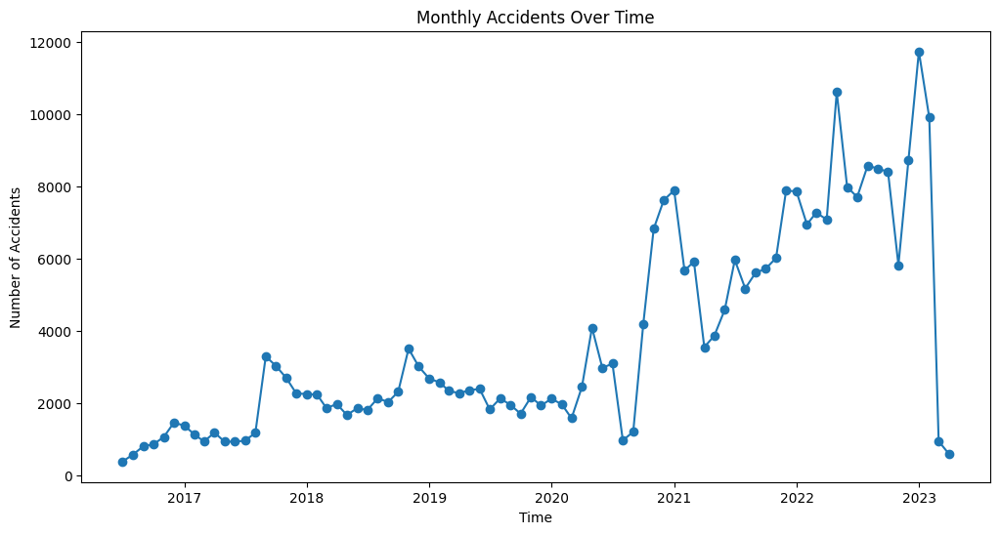

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df['Start_Time'] = pd.to_datetime(df['Start_Time'], format='%Y-%m-%d %H:%M:%S', errors='coerce') # Added format and errors parameters
df.set_index('Start_Time', inplace=True)
monthly_accidents = df.resample('M').size()

plt.figure(figsize=(12, 6))
plt.plot(monthly_accidents, marker='o')
plt.title('Monthly Accidents Over Time')
plt.xlabel('Time')
plt.ylabel('Number of Accidents')
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px


df['Start_Time'] = pd.to_datetime(df['Start_Time'], errors='coerce')

filtered_df = df[(df['Start_Time'].dt.year == 2023)]

filtered_df['Start_Lat'] = pd.to_numeric(filtered_df['Start_Lat'], errors='coerce')
filtered_df['Start_Lng'] = pd.to_numeric(filtered_df['Start_Lng'], errors='coerce')

# Create a scatter plot map with Plotly
fig = px.scatter_mapbox(
    filtered_df,
    lat='Start_Lat',
    lon='Start_Lng',
    hover_name='ID',
    hover_data={
        'Source': True,
        'Severity': True,
        'Start_Time': True,
        'End_Time': True,
        'Distance(mi)': True,
        'Roundabout': True,
        'Station': True,
        'Stop': True,
        'Traffic_Calming': True,
        'Traffic_Signal': True,
        'Turning_Loop': True,
        'Sunrise_Sunset': True,
        'Civil_Twilight': True,
        'Nautical_Twilight': True,
        'Astronomical_Twilight': True,
        'Start_Lat': False,
        'Start_Lng': False
    },
    color='Severity',
    color_continuous_scale='Viridis',
    zoom=5,
    height=600
)

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()


<ipython-input-23-e2b3c7abba92>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-e2b3c7abba92>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import plotly.express as px
import pandas as pd


fig = px.density_mapbox(
    df,
    lat='Start_Lat',
    lon='Start_Lng',
    z='Severity',
    radius=10,
    center=dict(lat=df['Start_Lat'].mean(), lon=df['Start_Lng'].mean()),
    zoom=10,
    mapbox_style='open-street-map',
    hover_data={'City': True, 'Severity': True}  # Add city to hover data
)

fig.update_layout(title='Accident Density Heatmap')
fig.show()
